# Multi Objective Evolutionary Algorithms

This chapter continues our consideration of evolutionary algorithms, but generalises to the case where we have more than one objective. First we need to import the usual stuff, and some new libraries so we can look at animations of the search:

In [1]:
import sys
import random
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## The Next Release Problem

As an example problem instance, we consider the Next Release Problem (NRP), which relates to the problem of balancing customer profits and requirements costs in requirements engineering. The aim is to maximise customer profits from a set of dependent requirements, under the constraints of a predefined budget bound. A solution to the NRP problem can inform a requirements engineer when making  a decision for software requirements to balance the profits of the company and the customers.

NRP is a classical problem in software engineering, and we will use example datasets taken from http://cstar.whu.edu.cn/p/nrp/. To represent a concrete NRP task, we need to represent the following information:
- For each requirement we need to store its cost
- For each requirement we need to store its dependencies (i.e. other requirements that need to be satisfied first)
- For each customer we need to store a weight that represents the importance of that customer
- For each customer we need to store the list of requirements that they desire

In [2]:
profit_map = {}        # customer id => weight
requirements_map = {}  # customer id => [ requirement_id * ]
cost_map = {}          # requirement id => cost
dependency_map = {}    # requirement id => [ requirement_id * ]
num_requirements = 140

We will use the standard interchance format for NRP problems (http://cstar.whu.edu.cn/p/nrp/), which looks as follows (taken from the `readme.txt`):

```
3
^ Level of requirements, t
20
^ Number of requirements in Level 1
4 3 4 1 5 5 5 3 5 3 4 4 3 5 1 1 3 2 2 3
^ Costs of requirements in Level 1 (the number is 20)
40
^ Number of requirements in Level 2
8 8 2 6 7 4 5 3 6 3 7 2 6 3 5 2 2 4 2 5 4 5 2 2 8 4 2 4 8 7 3 6 6 4 3 6 4 8 6 7
^ Costs of requirements in Level 2 (the number is 40)
80
^ Number of requirements in Level 3
9 6 10 6 9 10 7 9 7 6 10 6 5 10 5 6 6 6 5 6 8 10 9 6 10 7 10 8 9 9 6 10 8 8 10 10 6 7 6 8 7 10
^ Costs of requirements in Level 3 (the number is 80)
97
^ Number of dependencies
1 85
^ Id of RequirementA1   Id of RequirementB1
2 98
^ Id of RequirementA2   Id of RequirementB2
2 37
2 92
...
```

To parse these files we define a helper function:

In [3]:
def parse_nrp(filename):

    with open(filename) as fp:
        levels   = int(fp.readline())
        req_id = 1
        for level in range(levels):
            num_reqs = int(fp.readline())
            for cost in fp.readline().split():
                cost_map[req_id] = int(cost)
                req_id += 1
        total_deps = int(fp.readline())
        for num_dep in range(total_deps):
            r1, r2 = fp.readline().split()
            r1_id = int(r1)
            if r1_id in dependency_map:
                dependency_map[int(r1)].append(int(r2))
            else:
                dependency_map[int(r1)] = [int(r2)]

        total_customers = int(fp.readline())
        for num_cust in range(total_customers):
            customer = fp.readline().split()
            profit_map[num_cust + 1] = int(customer[0])
            num_reqs = int(customer[1])
            requirements = []
            for num_req in range(num_reqs):
                requirements.append(int(customer[2+num_req]))
            requirements_map[num_cust + 1] = requirements

        num_requirements = len(cost_map)

    print("Cost: {}".format(cost_map))
    print("Dependencies: {}".format(dependency_map))
    print("Profit: {}".format(profit_map))
    print("Requirements: {}".format(requirements_map))
    print("Num requirements: {}".format(num_requirements))

As running example, we will use the small instance `nrp1.txt`:

In [4]:
parse_nrp("data/nrp/nrp1.txt")

Cost: {1: 4, 2: 3, 3: 4, 4: 1, 5: 5, 6: 5, 7: 5, 8: 3, 9: 5, 10: 3, 11: 4, 12: 4, 13: 3, 14: 5, 15: 1, 16: 1, 17: 3, 18: 2, 19: 2, 20: 3, 21: 8, 22: 8, 23: 2, 24: 6, 25: 7, 26: 4, 27: 5, 28: 3, 29: 6, 30: 3, 31: 7, 32: 2, 33: 6, 34: 3, 35: 5, 36: 2, 37: 2, 38: 4, 39: 2, 40: 5, 41: 4, 42: 5, 43: 2, 44: 2, 45: 8, 46: 4, 47: 2, 48: 4, 49: 8, 50: 7, 51: 3, 52: 6, 53: 6, 54: 4, 55: 3, 56: 6, 57: 4, 58: 8, 59: 6, 60: 7, 61: 9, 62: 6, 63: 10, 64: 6, 65: 9, 66: 10, 67: 7, 68: 9, 69: 7, 70: 6, 71: 10, 72: 6, 73: 5, 74: 10, 75: 5, 76: 6, 77: 6, 78: 6, 79: 5, 80: 6, 81: 8, 82: 10, 83: 9, 84: 6, 85: 10, 86: 7, 87: 10, 88: 8, 89: 9, 90: 9, 91: 6, 92: 10, 93: 8, 94: 8, 95: 10, 96: 10, 97: 6, 98: 7, 99: 6, 100: 8, 101: 7, 102: 10, 103: 7, 104: 9, 105: 6, 106: 6, 107: 8, 108: 6, 109: 7, 110: 8, 111: 7, 112: 7, 113: 6, 114: 7, 115: 9, 116: 6, 117: 7, 118: 6, 119: 8, 120: 6, 121: 6, 122: 7, 123: 5, 124: 7, 125: 5, 126: 8, 127: 9, 128: 10, 129: 10, 130: 6, 131: 5, 132: 9, 133: 8, 134: 10, 135: 7, 136: 8,

A solution to an NRP problem is a choice of requirements. We can simply represent this as a binary vector of the length of the number of requirements, and for each index in the vector we use `0` or `1` to denote whether the requirement is chosen or not. This is a classical way to represent subset-selection (Knapsack) problems.

In [5]:
def get_random_individual():
    individual = [random.choice([0,1]) for _ in range(num_requirements)]
    return individual

In [6]:
%pprint  # Turn off pretty printing to avoid waste of space
get_random_individual()

Pretty printing has been turned OFF


[0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0]

We can also decode the individual to see the actual numbers of the requirements selected:

In [7]:
[i for i, x in enumerate(get_random_individual()) if x == 1]

[1, 2, 5, 6, 9, 10, 13, 15, 16, 18, 23, 24, 27, 28, 29, 34, 35, 36, 38, 41, 42, 43, 44, 46, 47, 53, 54, 56, 59, 62, 63, 64, 66, 69, 70, 71, 72, 73, 74, 80, 82, 83, 85, 86, 89, 91, 92, 93, 94, 95, 100, 103, 104, 105, 106, 107, 108, 110, 111, 112, 113, 115, 116, 117, 123, 126, 130, 131, 136, 138, 139]

In [8]:
%pprint  # Turn pretty printing back on now that we're done with long lists

Pretty printing has been turned ON


Since our representation is identical to the one we used for previous problems such as one max, we can also keep the same mutation function that implements simple bit flips:

In [9]:
def mutate(solution):
    P_mutate = 1/len(solution)
    mutated = solution[:]
    for position in range(len(solution)):
        if random.random() < P_mutate:
            mutated[position] = 1 - mutated[position]
    return mutated

The question of the fitness function, however, is slightly more tricky: There are actually two properties we would like to optimise. First, there is the profit, which we calculate as the sum of the weights of customers whose requirements are completely satisfied by the selection of requirements in a solution:

In [10]:
# Profit is the sum of the weights of customers whose requirements are satisfied
def function1(solution):
    fitness = 0

    requirements = set([x+1 for x in range(len(solution)) if solution[x] == 1])
    for customer_id in profit_map.keys():
        reqs = set(requirements_map[customer_id])
        if reqs.issubset(requirements):
            fitness += profit_map[customer_id]

    return fitness

The second dimension for optimisation are the costs. Obviously, the smaller the costs, the better for the company implementing the software system. We calculate the costs simply as the sum of the costs of the chosen requirements:

In [11]:
# Cost is the sum of costs of the implemented requirements
def function2(solution):
    cost = 0

    for i in range(num_requirements):
        if solution[i]:
            cost += cost_map[i+1]

    return cost

Note that we want to minimise, and not maximise, the costs. We do, however, know the worst possible fitness value for cost, which is simply the cost of selecting all requirements:

In [12]:
total_costs = sum([ cost_map[i+1] for i in range(num_requirements)])

In [13]:
total_profit = sum(profit_map.values())

There are also dependencies between the requirements -- we'll ignore these for now to keep the example simple. In principle, however, we would need to factor these in as well in some way. For example, we could always add dependencies before evaluating fitness, or we could include the degree to which dependencies are satisfied in the fitness calculation, or we could constraint our `get_random_individual` and `mutate` functions to only return solutions where dependencies are satisfied.

A random search would again consist of sampling a number of random solutions. Instead of looking at a single plot over time, however, the solutions are actually in a two-dimensional fitness space:

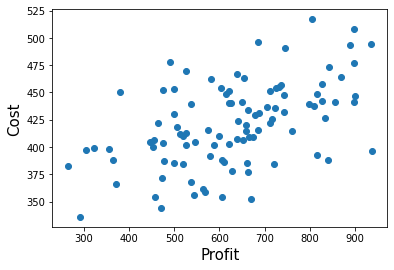

In [14]:
example_population = [get_random_individual() for _ in range(100)]
function1_values = [function1(x) for x in example_population]
function2_values = [function2(x) for x in example_population]
plt.xlabel('Profit', fontsize=15)
plt.ylabel('Cost', fontsize=15)
plt.scatter(function1_values, function2_values)
plt.show()

There is a trade-off between cost and profit: More profitable solutions tend to also have higher costs; the lowest costs can be achieved by not implementing anything, which would also bring no profit. In this two-dimensional plot, solutions that are in the bottom right corner are the best, since they achieve high profit at low costs.

In the previous chapter, we noted that we are redundantly calculating fitness values. To make things more realistic, we are now going to cache fitness values in individuals. We will simply do this by adding a `fitness` field to an individual; if this isn't set, then fitness has not been calculated. In Python we can simply introduce new attributes to objects by setting them, but this does not hold for some built-in objects such as lists, which we've been using for all our representations so far. We will thus introduce a wrapper class for a list, simply for the sake of allowing us to cache fitness values:

In [15]:
class L(list):
    """
    A subclass of list that can accept additional attributes.
    Should be able to be used just like a regular list.
    """
    def __new__(self, *args, **kwargs):
        return super(L, self).__new__(self, args, kwargs)

    def __init__(self, *args, **kwargs):
        if len(args) == 1 and hasattr(args[0], '__iter__'):
            list.__init__(self, args[0])
        else:
            list.__init__(self, args)
        self.__dict__.update(kwargs)

    def __call__(self, **kwargs):
        self.__dict__.update(kwargs)
        return self

We can now store the fitness values of individuals as attributes of the objects

In [16]:
def evaluate(individual):
    individual.fitness1 = function1(individual)
    individual.fitness2 = function2(individual)

We will keep individuals immutable, such that mutation or crossover do not change any values and we never need to recalculate fitness values. But we need to update operations that produce new individuals to calculate the fitness value on these, i.e. when creating random individuals, and when mutating them (we do not need to evaluate fitness after crossover, since we always call `mutate` after crossover). We can now instantiate random individuals of NRP solutions using instances of `L` rather than lists:

In [17]:
def get_random_individual():
    individual = L(random.choice([0,1]) for _ in range(num_requirements))
    evaluate(individual)
    return individual

In [18]:
def mutate(solution):
    P_mutate = 1/len(solution)
    mutated = L(solution[:])
    for position in range(len(solution)):
        if random.random() < P_mutate:
            mutated[position] = 1 - mutated[position]
    evaluate(mutated)
    return mutated

We can check that the fields are set correctly:

In [19]:
x = get_random_individual()
print(f"Fitness 1: {x.fitness1}, fitness 2: {x.fitness2}")

Fitness 1: 553, fitness 2: 391


### Weighted Fitness

A basic way to apply metaheuristic search algorithms to problems such as NRP where we have more than one optimisation goal is to build a linear combination of the individual objective values to form a single fitness value. When doing this, one has to assign weights to measure the trade-off between the different objectives. We also need to take care in combining our two fitness values, as one is a maximisation problem and the other is a minimisation problem. We can convert the cost-function to a maximisation problem by deducting the costs from the `total_costs`:

In [20]:
def get_fitness(individual):
    # Maximise profit (fitness1), minimise cost (fitness 2)
    return 10*individual.fitness1 + (total_costs - individual.fitness2)

While we can look at the evolution of this fitness value over time, it is also of interest to see how the individual fitness values evolve independently. For this we need to look at a two-dimensional plot like above, for each iteration of the algorithm. To achieve this, we will produce an animation.

In [21]:
ims = []  # global variable to store images of the animation
fitness_values = []
diversity_values = []
    
def initialise_plot():
    global ims
    global fitness_values
    global diversity_values
    global fig
    global ax
    
    ims = []
    fitness_values = []
    diversity_values = []

    %matplotlib agg
    fig, ax = plt.subplots()
    plt.xlabel('Profit', fontsize=15)
    plt.ylabel('Cost', fontsize=15)
    ims = []
    %matplotlib inline

For each iteration of the algorithm, we will update this animation with a snapshot of the current population and their fitness values:

In [22]:
def plot(population):
    function1_values = [x.fitness1 for x in population]
    function2_values = [x.fitness2 for x in population]
    
    ims.append((ax.scatter(function1_values, function2_values, color="blue"),))

Since we are still optimising a population of binary vectors, we can also keep track of population diversity like in the last chapter.

In [23]:
def hamming_distance(individual1, individual2):
    return sum(c1 != c2 for c1, c2 in zip(individual1, individual2))

In [24]:
def pairwise_distance(population):
    distances = 0
    for i in range(len(population)-1):
        for j in range(i, len(population)):
           distances += hamming_distance(population[i], population[j]) 
    return distances

We will start with a simple genetic algorithm again, which means we also need a selection operator:

In [25]:
tournament_size=3
def tournament_selection(population, n=tournament_size):
    max_fitness = -sys.maxsize - 1
    winner = None
    for candidate in [random.choice(population) for _ in range(tournament_size)]:
        fitness = get_fitness(candidate)
        if fitness > max_fitness:
            winner = candidate
            max_fitness = fitness
    return winner

Note that we do call `get_fitness` here again, but it just calculates the weighted sum of the already stored objective values, so we will not count it towards the total fitness evaluations.

We can also keep elitism unchanged without it requiring potentially costly fitness computations:

In [26]:
elite_size = 1
def elitism(population):
    population.sort(key=lambda k: get_fitness(k), reverse=True)
    return population[:elite_size]

Finally, we also need to update our crossover operator to use our wrapper `L` class. However, we don't need to calculate fitness here since this already happens in the mutation operator. (This is a simplifcation we can use in the specific algorithm we have implemented, and it may not generalise. More generally, one would use an explicit evaluation step in the search algorithm).

In [27]:
def crossover(parent1, parent2):
    pos = random.randint(0, len(parent1))
    offspring1 = L(parent1[:pos] + parent2[pos:])
    offspring2 = L(parent2[:pos] + parent1[pos:])
    return (offspring1, offspring2)

In [28]:
population_size = 20
P_xover = 0.7
max_gen = 100
selection = tournament_selection

We can update the genetic algorithm to use our updated functions, which reduces the clutter a bit compared to previous versions. Going forward, we will compare algorithms on multi-objective problems in terms of iterations rather than individual fitness evaluations, since we want to look at the evolution of the entire population.

In [29]:
def ga():
    initialise_plot()
    population = [get_random_individual() for _ in range(population_size)]
    diversity_values.append(pairwise_distance(population))
    best_fitness = -sys.maxsize - 1
    for p in population:
        fitness = get_fitness(p)
        if fitness > best_fitness:
            best_fitness = fitness
    print("Iteration 0, best fitness: {}".format(best_fitness))

    for iteration in range(max_gen):
        plot(population)
        fitness_values.append(best_fitness)
        new_population = elitism(population)
        while len(new_population) < len(population):
            parent1 = selection(population)
            parent2 = selection(population)

            if random.random() < P_xover:
                offspring1, offspring2 = crossover(parent1, parent2)
            else:
                offspring1, offspring2 = parent1, parent2

            offspring1 = mutate(offspring1)
            offspring2 = mutate(offspring2)
            
            new_population.append(offspring1)
            new_population.append(offspring2)

        population = new_population
        diversity_values.append(pairwise_distance(population))
        for p in population:
            fitness = get_fitness(p)
            if fitness > best_fitness:
                best_fitness = fitness
                best_solution = p
                print("Iteration {}, best fitness: {}".format(iteration, best_fitness))

    plot([best_solution])

    return [best_solution]

Calling the genetic algorithm now will use the weighted combination defined above, which weights profit higher than costs.

In [30]:
result = ga()

Iteration 0, best fitness: 9602
Iteration 1, best fitness: 9618
Iteration 1, best fitness: 11969
Iteration 2, best fitness: 11972
Iteration 3, best fitness: 11976
Iteration 3, best fitness: 12234
Iteration 3, best fitness: 12323
Iteration 3, best fitness: 12900
Iteration 4, best fitness: 12908
Iteration 6, best fitness: 13334
Iteration 7, best fitness: 14124
Iteration 8, best fitness: 14134
Iteration 8, best fitness: 14475
Iteration 9, best fitness: 14983
Iteration 10, best fitness: 16552
Iteration 12, best fitness: 17125
Iteration 13, best fitness: 17127
Iteration 14, best fitness: 17131
Iteration 14, best fitness: 17730
Iteration 15, best fitness: 17763
Iteration 17, best fitness: 17958
Iteration 17, best fitness: 18075
Iteration 19, best fitness: 18342
Iteration 20, best fitness: 18536
Iteration 24, best fitness: 19099
Iteration 25, best fitness: 19195
Iteration 26, best fitness: 19278
Iteration 27, best fitness: 19452
Iteration 30, best fitness: 19594
Iteration 30, best fitness: 20

The overall fitness values look like any other fitness function we have seen in the past.

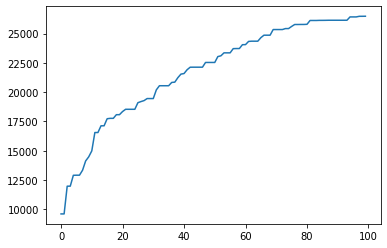

In [31]:
plt.plot(fitness_values)

The population diversity usually mirrors the fitness curve: Once fitness starts to converge, the population diversity is strongly reduced.

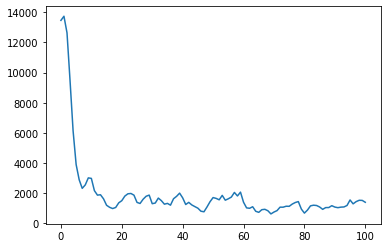

In [32]:
plt.plot(diversity_values)

To understand how the evolution affects the solutions with respect to the constituent objectives we need to consider their values over time (If you are looking at the PDF export, you will be missing this bit).

In [33]:
im_ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=3000, blit=True)
HTML(im_ani.to_jshtml())

Our weighted combination puts more focus on maximising profit than on minimising the costs, which you can see by the solutions moving towards the upper right corner of the plot. We can change the outcome of the search by changing that balance:

In [34]:
def get_fitness(individual):
    # Maximise profit (fitness1), minimise cost (fitness 2)
    return individual.fitness1 + 10*(total_costs - individual.fitness2)

In [35]:
result = ga()

Iteration 0, best fitness: 5713
Iteration 0, best fitness: 5759
Iteration 1, best fitness: 5773
Iteration 1, best fitness: 5838
Iteration 2, best fitness: 5881
Iteration 2, best fitness: 5956
Iteration 3, best fitness: 6016
Iteration 3, best fitness: 6036
Iteration 4, best fitness: 6143
Iteration 5, best fitness: 6261
Iteration 6, best fitness: 6310
Iteration 7, best fitness: 6312
Iteration 7, best fitness: 6362
Iteration 8, best fitness: 6370
Iteration 9, best fitness: 6410
Iteration 9, best fitness: 6482
Iteration 10, best fitness: 6532
Iteration 10, best fitness: 6582
Iteration 11, best fitness: 6695
Iteration 11, best fitness: 6712
Iteration 12, best fitness: 6775
Iteration 15, best fitness: 6840
Iteration 16, best fitness: 6858
Iteration 16, best fitness: 6890
Iteration 17, best fitness: 6923
Iteration 17, best fitness: 6928
Iteration 19, best fitness: 6960
Iteration 20, best fitness: 7043
Iteration 22, best fitness: 7110
Iteration 23, best fitness: 7180
Iteration 25, best fitness

Considering the combined fitness values there is no obvious difference except for the scale of the values:

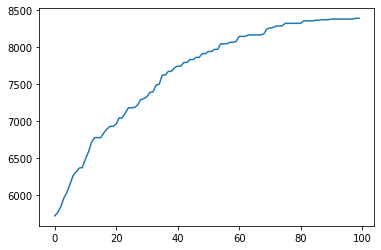

In [36]:
plt.plot(fitness_values)

Considering the evolution of both objectives is more telling again:

In [37]:
im_ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=3000, blit=True)
HTML(im_ani.to_jshtml())

The likely outcome is that using the adapted weights, when giving more preference to reducing costs, the resulting solution achieves little profit at all.

Maybe a better solution would be to use more similar weights for both components?

In [38]:
def get_fitness(individual):
    # Maximise profit (fitness1), minimise cost (fitness 2)
    return individual.fitness1 + 4 * (total_costs - individual.fitness2)

In [39]:
result = ga()
diversity_ga = diversity_values

Iteration 0, best fitness: 2544
Iteration 0, best fitness: 2572
Iteration 1, best fitness: 2584
Iteration 1, best fitness: 2614
Iteration 2, best fitness: 2659
Iteration 3, best fitness: 2694
Iteration 4, best fitness: 2699
Iteration 5, best fitness: 2706
Iteration 5, best fitness: 2752
Iteration 7, best fitness: 2754
Iteration 7, best fitness: 2788
Iteration 9, best fitness: 2813
Iteration 10, best fitness: 2815
Iteration 10, best fitness: 2841
Iteration 11, best fitness: 2908
Iteration 13, best fitness: 2913
Iteration 14, best fitness: 2926
Iteration 14, best fitness: 2928
Iteration 14, best fitness: 2936
Iteration 15, best fitness: 2938
Iteration 15, best fitness: 2952
Iteration 16, best fitness: 2958
Iteration 18, best fitness: 3001
Iteration 19, best fitness: 3033
Iteration 20, best fitness: 3058
Iteration 20, best fitness: 3068
Iteration 21, best fitness: 3086
Iteration 24, best fitness: 3096
Iteration 25, best fitness: 3111
Iteration 28, best fitness: 3117
Iteration 28, best fit

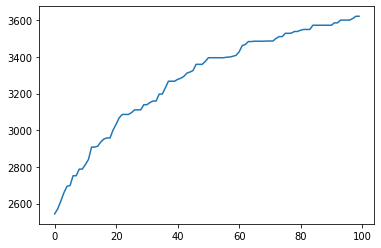

In [40]:
plt.plot(fitness_values)

In [41]:
im_ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=3000, blit=True)
HTML(im_ani.to_jshtml())

The result seems like a better compromise this time -- the profit increases, while the costs don't increase dramatically over time. Finding a balance in the weighting is not easy, and the solution we got in the end might not actually be a particularly good one.

## Pareto dominance

An individual Pareto-dominates another one if and only if it has a strictly better fitness value for at least one objective without having a worse fitness value for any other objectives. This condition can be simply implemented as follows for our scenario with two objective functions:

In [42]:
def dominates(solution1, solution2):
    """
     A solution x(1) is said to dominate the other solution x(2) if both condition 1 and 2 below are true:

     Condition 1: x(1) is no worse than x(2) for all objectives
     Condition 2: x(1) is strictly better than x(2) in at least one objective
    """
    if solution1.fitness1 < solution2.fitness1 or solution1.fitness2 < solution2.fitness2:
        return False

    if solution1.fitness1 > solution2.fitness1 or solution1.fitness2 > solution2.fitness2:
        return True

    return False

For example, consider the following dummy individuals:

In [43]:
x1 = L()
x1.fitness1 = 80
x1.fitness2 = 60

x2 = L()
x2.fitness1 = 60
x2.fitness2 = 80

x3 = L()
x3.fitness1 = 80
x3.fitness2 = 90

x4 = L()
x4.fitness1 = 90
x4.fitness2 = 80

Individuals `x1` and `x2` do not dominate each other: `x1` has a better fitness value for `fitness1` while `x2` has a better fitness value for `fitness2`.

In [44]:
dominates(x1, x2)

False

In [45]:
dominates(x2, x1)

False

Individual `x3` dominates both, `x1` and `x2`, as it is not worse in any of the fitness values, and it is better in at least one for each pair:

In [46]:
dominates(x3, x1)

True

In [47]:
dominates(x3, x2)

True

Individual `x4` also dominates `x1` and `x2`:

In [48]:
dominates(x4, x1)

True

In [49]:
dominates(x4, x2)

True

However, `x3` and `x4` do not dominate each other:

In [50]:
dominates(x4, x3)

False

In [51]:
dominates(x3, x4)

False

The solutions in a population can be sorted into Pareto _fronts_. Individuals within a front are non-dominating to each other. Fronts are sorted into levels; an individual in front _n_ is dominated by at least one individual in front _n-1_. The first front consists of solutions that are not dominated by any other candidate solutions.

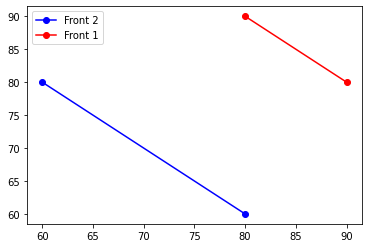

In [52]:
plt.plot([x1.fitness1, x2.fitness1], [x1.fitness2, x2.fitness2], 'ro-', label="Front 2", color="blue")
plt.plot([x3.fitness1, x4.fitness1], [x3.fitness2, x4.fitness2], 'ro-', label="Front 1")
plt.legend()

The principle of Pareto dominance is used by many multi-objective optimisation algorithms. The aim is to find a Pareto front that approximates the true Pareto front as closely as possible.

## NSGA-II

As an example multi-objective adaptation of a genetic algorithm, we will consider the non-dominating sorting genetic algorithm, in its second incarnation, NSGA-II. This is one of the most popular multi-objective optimisation algorithms, and it is explained in detail in the following paper:

K. Deb, A. Pratap, S. Agarwal, T. Meyarivan. A fast and elitist multiobjective genetic algorithm: NSGA-II. IEEE Transactions on Evolutionary Computation, 6(2), 182-197. 2002.

The overall workflow of the non-dominating sorting genetic algorithm (NSGA-II) is as follows, for each iteration of the algorithm:

1. Combine parent generation $P_i$ and offspring $O_i$
2. Sort combined population into Pareto fronts $F$
3. Create new generation $P_{t+1}$ as empty set
4. For each front in $F$: Copy front into $P_{t+1}$ if the entire front fits into $P_{t+1}$
5. Let $F_i$ be the first front that does not completely fit into $P_{t+1}$. Sort $F_i$ by crowding distance
6. Select the first $n$ individuals from $F_i$, if there are $n$ remaining places in $P_{t+1}$.
7. Create offspring population $Q_{t+1}$

The first aspect of this algorithm is the sorting of populations into Pareto fronts. This is done by determining for each individual in the population (1) how many other individuals it is dominated by, and (2) which individuals it dominates. Then, we can iteratively build fronts by selecting individuals that have a domination counter of 0, and reducing the domination counter of all the individuals they dominate by 1:

In [53]:
def fast_non_dominated_sort(solutions):
    front = [[]]

    S = [[] for _ in range(len(solutions))]
    n = [0 for _ in range(len(solutions))]

    for p in range(len(solutions)):
        S[p] = []
        n[p] = 0
        for q in range(len(solutions)):
            if dominates(solutions[p], solutions[q]):
                S[p].append(q)
            elif dominates(solutions[q], solutions[p]):
                n[p] = n[p] + 1

        if n[p] == 0:
            front[0].append(p)
            solutions[p].rank = 0

    i = 0
    while front[i]:
        Q = []
        for p in front[i]:
            for q in S[p]:
                n[q] = n[q] - 1
                if n[q] == 0:
                    Q.append(q)
                    solutions[q].rank = i + 1
        i = i + 1
        front.append(Q)

    del front[len(front) - 1]
    return front

We are storing the rank in the current population in the attribute `rank`, which we will need later during selection.

We can try this using our example individuals from above:

In [54]:
fast_non_dominated_sort([x1, x2, x3, x4])

[[2, 3], [0, 1]]

As you can see, the algorithm returns the indices of the individuals rather than copies of the individuals.

The next new aspect of the NSGA-II algorithm occurs when the next front does not entirely fit into the next generation. In this case, we need to sort the next front by crowding distance, such that we can select the most diverse individuals. For each objective function we sort the individuals by their objective value. We then calculate a crowding distance value for each individual. The individuals with minimum and maximum fitness values are assigned a very large crowding distance to ensure they are ranked first (we just use a very large value of `4444444444444444` to ensure that). All other individuals are assigned the sum of distance values between their neighbours in objective space for all objectives:

In [55]:
def calculate_crowding_distance_and_sort(front):

    data = [(x, front[x].fitness1, front[x].fitness2) for x in range(len(front))]
    sorted1 = [(x, y) for (x, y, z) in sorted(data, key=lambda tup: tup[1])]
    sorted2 = [(x, z) for (x, y, z) in sorted(data, key=lambda tup: tup[2])]

    distance = [0 for _ in range(0,len(front))]
    range_fitness1 = max(x.fitness1 for x in front) - min(x.fitness1 for x in front)
    range_fitness2 = max(x.fitness2 for x in front) - min(x.fitness2 for x in front)

    distance[sorted1[0][0]] = 4444444444444444
    distance[sorted1[-1][0]] = 4444444444444444

    distance[sorted2[0][0]] = 4444444444444444
    distance[sorted2[-1][0]] = 4444444444444444

    for k in range(1,len(front)-1):
        index = sorted1[k][0]
        distance[index] = distance[index] + (sorted1[k+1][1] - sorted1[k-1][1]) / range_fitness1

    for k in range(1,len(front)-1):
        index = sorted2[k][0]
        distance[index] = distance[index] + (sorted2[k+1][1] - sorted2[k-1][1]) / range_fitness2

    for k in range(0, len(front)):
        front[k].distance = distance[k]

    front.sort(key = lambda i: i.distance, reverse=True)

The algorithm expects a front in terms of the actual individuals rather than indices. We need to extend our example fronts now though, because the individuals with the minimum and maximum value for each objective function are always sorted first, and the fronts in our previous examples consist only of two individuals each.

In [56]:
x1 = L(1)
x1.fitness1 = 90
x1.fitness2 = 50

x2 = L(2)
x2.fitness1 = 60
x2.fitness2 = 80

x3 = L(3)
x3.fitness1 = 80
x3.fitness2 = 60

x4 = L(4)
x4.fitness1 = 50
x4.fitness2 = 90

x5 = L(5)
x5.fitness1 = 92
x5.fitness2 = 95

x6 = L(6)
x6.fitness1 = 99
x6.fitness2 = 90

x7 = L(7)
x7.fitness1 = 99
x7.fitness2 = 90

x8 = L(8)
x8.fitness1 = 95
x8.fitness2 = 92

There are still two fronts in our example population:

In [57]:
fast_non_dominated_sort([x1, x2, x3, x4, x5, x6, x7, x8])

[[4, 5, 6, 7], [0, 1, 2, 3]]

To apply our sorting we need to pass in the actual individuals, in order to access their fitness values.

In [58]:
pop = [x1, x2, x3, x4, x5, x6, x7, x8]
front1 = [pop[index] for index in fast_non_dominated_sort(pop)[0]]
calculate_crowding_distance_and_sort(front1)

# Print population indices of sorted front1
[pop.index(x) for x in front1]

[5, 6, 4, 7]

The individuals at index 5 and 6 (`x6` and `x7`) are ranked first, because they are at the max and min of the fitness scores for the two objectives. The individuals `x4` and `x8` are ranked afterwards.

To generate an offspring population, NSGA-II uses binary tournament selection, but since there isn't a single fitness value to compare, the winner of the tournament is determined by the rank in the fronts as well as the crowding distance. An individual is selected if the rank is less than the rank of the other individual, or if the crowding distance is greater than that of the other individual.

In [59]:
def binary_rank_tournament(population):
    individual1 = random.choice(population)
    individual2 = random.choice(population)

    if individual1.rank < individual2.rank:
        return individual1
    elif individual1.rank > individual2.rank:
        return individual2
    else:
        return max([individual1, individual2], key = lambda i: i.distance)

The use of crowding distance during parent and survivor selection serves to increase diversity. To see whether this is achieved, we will keep track of population diversity again.

Besides this selection operator, crossover and mutation are applied as usual to derive a new generation:

In [60]:
def generate_offspring(population):
    offspring_population = []
    while len(offspring_population) < len(population):
        parent1 = binary_rank_tournament(population)
        parent2 = binary_rank_tournament(population)
        if random.random() < P_xover:
            offspring1, offspring2 = crossover(parent1, parent2)
        else:
            offspring1, offspring2 = parent1, parent2
            
        offspring1 = mutate(offspring1)
        offspring2 = mutate(offspring2)

        offspring_population.append(offspring1)
        offspring_population.append(offspring2)

    return offspring_population

In [61]:
def get_initial_population(population_size):
    population = [get_random_individual() for _ in range(population_size)]
    fronts = fast_non_dominated_sort(population)
    
    for front_indices in fronts:
        front = [population[index] for index in front_indices]
        calculate_crowding_distance_and_sort(front)

    return population

Before we can apply NSGA-II on our NRP problem, we need to update the dominator relation, since we are maximising profit but minising costs (the previous definition of domination assumed maximisation of both objectives).

In [62]:
def dominates(solution1, solution2):
    """
     A solution x(1) is said to dominate the other solution x(2) if both condition 1 and 2 below are true:

     Condition 1: x(1) is no worse than x(2) for all objectives
     Condition 2: x(1) is strictly better than x(2) in at least one objective
     
     We are maximising fitness 1, but minimising fitness 2
    """
    if solution1.fitness1 < solution2.fitness1 or solution1.fitness2 > solution2.fitness2:
        return False

    if solution1.fitness1 > solution2.fitness1 or solution1.fitness2 < solution2.fitness2:
        return True

    return False

With this, we can implement the full algorithm.

In [63]:
def nsgaii():
    initialise_plot()
    population = get_initial_population(population_size)
    diversity_values.append(pairwise_distance(population))    
    offspring_population = generate_offspring(population)

    for iteration in range(max_gen):
        print("Iteration {}".format(iteration))

        combined = population + offspring_population
        plot(combined)
        non_dominated_sorted_solution = fast_non_dominated_sort(combined)
        population = []

        for i in range(len(non_dominated_sorted_solution)):
            front = [combined[index] for index in non_dominated_sorted_solution[i]]
            calculate_crowding_distance_and_sort(front)

            for i in front:
                population.append(i)
                if len(population) == population_size:
                    break
            if len(population) == population_size:
                break

        diversity_values.append(pairwise_distance(population))
        offspring_population = generate_offspring(population)

    non_dominated_sorted_solution = fast_non_dominated_sort(population)
    result = [population[x] for x in non_dominated_sorted_solution[0]]
    plot(result)

    for p in result:
        print("Result: {}, Profit: {}, Cost: {}".format([x for x in range(len(p)) if p[x] == 1], function1(p), function2(p)))
    return result

In [64]:
result = nsgaii()

Iteration 0
Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10
Iteration 11
Iteration 12
Iteration 13
Iteration 14
Iteration 15
Iteration 16
Iteration 17
Iteration 18
Iteration 19
Iteration 20
Iteration 21
Iteration 22
Iteration 23
Iteration 24
Iteration 25
Iteration 26
Iteration 27
Iteration 28
Iteration 29
Iteration 30
Iteration 31
Iteration 32
Iteration 33
Iteration 34
Iteration 35
Iteration 36
Iteration 37
Iteration 38
Iteration 39
Iteration 40
Iteration 41
Iteration 42
Iteration 43
Iteration 44
Iteration 45
Iteration 46
Iteration 47
Iteration 48
Iteration 49
Iteration 50
Iteration 51
Iteration 52
Iteration 53
Iteration 54
Iteration 55
Iteration 56
Iteration 57
Iteration 58
Iteration 59
Iteration 60
Iteration 61
Iteration 62
Iteration 63
Iteration 64
Iteration 65
Iteration 66
Iteration 67
Iteration 68
Iteration 69
Iteration 70
Iteration 71
Iteration 72
Iteration 73
Iteration 74
Iteration 75
Iteration 76
Iteration

Since there is no weighted combination of individual we cannot consider the general fitness evolution, but we can check whether the algorithm succeeds in maintaining higher diversity throughout evolution:

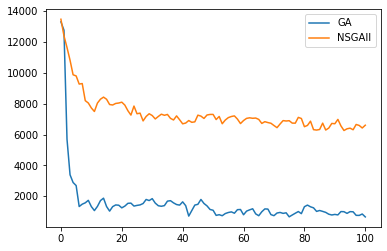

In [65]:
diversity_nsgaii = diversity_values # Keep for comparison
plt.plot(diversity_ga, label = "GA")
plt.plot(diversity_nsgaii, label = "NSGAII")
plt.legend()

The last plot should show that NSGAII indeed succeeds in achieving a higher diversity. The objective function plots are more difficult to interpret: 

In [66]:
im_ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=3000, blit=True)
HTML(im_ani.to_jshtml())

Intuitively, the population of the NSGAII spreads out further across the search space, and appears to cover more and better parts of the Pareto front.

Did NSGAII actually produce better solutions? The answer is not so easy because the algorithm does not produce a single solution, but an entire Pareto front which consists of non-dominating solutions. 

Let's run some experiments on both algorithms and then try to compare the algorithms:

In [67]:
from IPython.utils import io

def run_times(algorithm, repetitions):
    global fitness_values, diversity_values, ims
    result = []
    for i in range(repetitions):
        ims = []
        fitness_values = []
        diversity_values = []
        with io.capture_output() as captured: 
            front = algorithm()
        result.append(front)
    return result

In [68]:
solutions_ga = run_times(ga, 10)

In [69]:
fronts_nsgaii = run_times(nsgaii, 10)

The GA gives us a single value, while NSGA-II gives us a choice in terms of the Pareto front. One thing we can check is whether in the Pareto front there are values that are better than those produced by the GA:

Text(0.5, 1.0, 'Cost')

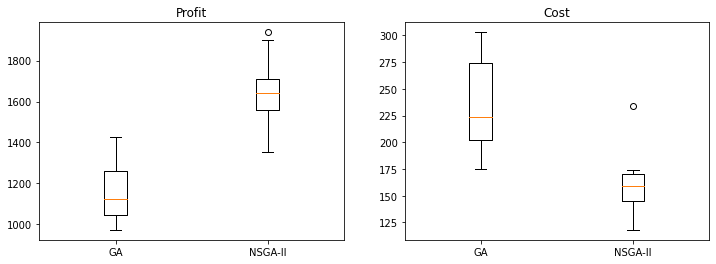

In [70]:
function1_values = []
function2_values = []
function1_ga = []
function2_ga = []

for front in fronts_nsgaii:
    function1_values.append(max([solution.fitness1 for solution in front]))
    function2_values.append(min([solution.fitness2 for solution in front]))
        
for solution in solutions_ga:
    function1_ga.append(solution[0].fitness1)
    function2_ga.append(solution[0].fitness2)

results = {"GA"      : function1_ga, 
           "NSGA-II" : function1_values }

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))
axes[0].boxplot(results.values())
axes[0].set_xticklabels(results.keys())

results = {"GA"      : function2_ga, 
           "NSGA-II" : function2_values }
axes[1].boxplot(results.values())
axes[1].set_xticklabels(results.keys())

axes[0].set_title('Profit')
axes[1].set_title('Cost')

NSGA-II usually is able to produce solutions with higher profit and with lower costs. But what if we want a compromise, rather than extremes? The question really is whether the Pareto front itself covers different trade-offs better, so we need to move from comparing individual fitness values to comparing entire Pareto fronts.

## Comparing multi-objective optimisation algorithms

Comparison of the results of multi-objective algorithms is not as straightforward as comparing two scalar values. Empirical evaluation of different MOEAs becomes a meta-comparison: it is not only about the domain-specific quality, but it is also about the quality of the front itself. Properties that we want to evaluate are the closeness to the true Pareto front, as well as the diversity of the solutions on the Pareto front.  

### Closeness to the true front

For some problems, the true front is indeed known -- for example for benchmark problems which are specifically constructed to compare algorithms. If the true front is not known, it is also possible to approximate it by collecting all known solutions from all MOEAs involved, and extracting a single Pareto front from the collected solutions. 

Given a reference front $\Lambda = \{ y_1, y_2, \ldots, y_r\}$ (even if approximated) we can calculate the closeness of a solution set $V$ obtained by a MOEA using one of the following two metrics:


- IGD: average distance from each reference point to its closest solution.
$IGD(V,\Lambda) = \frac{1}{r}\left(\displaystyle\sum_{i=1}^r d(y_i, V)^2 \right)^{1/2}$

- GD: average distance from each solution to its closest reference point:
$GD(V, \Lambda) = IGD(\Lambda,V)$


These metrics represent how far the front produced by a search algorithm is from the true Pareto front $\lambda$. Lower values of GD/IGD represent better performance; IGD is usually preferred because it does not any partsof the true Pareto set in the comparison.

In [71]:
from math import sqrt
def distance(solution, front):
    min_distance = None
    
    for y in front:
        a = solution.fitness1 - y.fitness1
        b = solution.fitness2 - y.fitness2
        d = sqrt(a*a + b*b)
        if min_distance == None or d < min_distance:
            min_distance = d
    
    return min_distance

In [72]:
def igd(front, reference_front):
    r = len(reference_front)

    sum_distances = 0
    for i in range(r):
        sum_distances += distance(reference_front[i], front) ** 2
    
    d = sqrt(sum_distances) / r
    
    return d

Let's set up an artificial example as above, with two fronts:

In [73]:
x1, x2, x3, x4, x5, x6, x7, x8 = L(1), L(2), L(3), L(4), L(5), L(6), L(7), L(8)

x1.fitness1, x1.fitness2 = 90, 50
x2.fitness1, x2.fitness2 = 60, 80
x3.fitness1, x3.fitness2 = 80, 60
x4.fitness1, x4.fitness2 = 50, 90

x5.fitness1, x5.fitness2 = 92, 95
x6.fitness1, x6.fitness2 = 99, 90
x7.fitness1, x7.fitness2 = 99, 90
x8.fitness1, x8.fitness2 = 95, 92

y1, y2 = L(1), L(2)
y1.fitness1, y1.fitness2 = 100, 99
y2.fitness1, y2.fitness2 = 99, 100

front1 = [x1, x2, x3, x4]
front2 = [x5, x6, x7, x8]

reference_front = [y1, y2]

As you may recall from the example above, `front2` is better than `front1`, and we would like to see this reflected in their `igd` values:

In [74]:
igd(front1, reference_front)

30.991934434623474

In [75]:
igd(front2, reference_front)

6.082762530298219

The generational distance is simply the inverse of `igd`:

In [76]:
def gd(front, reference_front):
    return igd(reference_front, front)

In [77]:
gd(front1, reference_front)

23.510635891017493

In [78]:
gd(front2, reference_front)

4.415880433163924

If we want to apply this to our Next Release Problem solutions, we first need to produce an approximate Pareto front:

In [79]:
merged_fronts = [] 
for front in fronts_nsgaii:
    merged_fronts.extend(front)
for front in solutions_ga:
    merged_fronts.extend(front)    
    
sorted_results = fast_non_dominated_sort(merged_fronts)[0]
reference_front = [merged_fronts[x] for x in sorted_results]

Now we can calculate the metrics for our solutions:

[Text(1, 0, 'GA'), Text(2, 0, 'NSGA-II')]

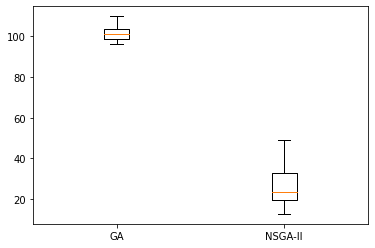

In [80]:
igd_ga = []
igd_nsgaii = []

for front in fronts_nsgaii:
    igd_nsgaii.append(igd(front, reference_front))
        
for solution in solutions_ga:
    igd_ga.append(igd(solution, reference_front))

results = {"GA"      : igd_ga, 
           "NSGA-II" : igd_nsgaii }

fig, ax = plt.subplots()
ax.boxplot(results.values())
ax.set_xticklabels(results.keys())

Since the distance for GA is higher, this means that the solution is further away from the (approximated) true Pareto front.

### Hypervolume

The generational distance metric is known to be problematic (see lecture slides). The hypervolume is an alternative metric that measures the area (space) dominated by a given Pareto front. It is a unary indicator as it does not need a reference front, but it does require a reference point.

A disadvantage of the hypervolume compared to the previous metrics is that it its calculation is more complex. However, for the 2-dimensional case (as in our example) it essentially boils down to calculating the sum of areas of rectangles in objective space defined by the points on the pareto front.

For our example fronts with fake points, let's assume our reference point is $(0,0)$. We thus need to calculate the area of the following rectangles:

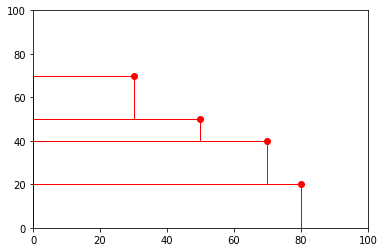

In [81]:
import matplotlib.patches as patches
from matplotlib.patches import Rectangle

example_front = [(80, 20), (70, 40), (50, 50), (30, 70)]

plt.xlim(0, 100)
plt.ylim(0, 100)

plt.plot(example_front[0][0], example_front[0][1], 'ro')
plt.plot(example_front[1][0], example_front[1][1], 'ro')
plt.plot(example_front[2][0], example_front[2][1], 'ro')
plt.plot(example_front[3][0], example_front[3][1], 'ro')

ax = plt.gca()
rect = Rectangle((0, 0), example_front[0][0], example_front[0][1],linewidth=1,edgecolor='r',facecolor='none')
ax.add_patch(rect)
rect = Rectangle(example_front[1], -example_front[1][0], - (example_front[1][1] - example_front[0][1]), linewidth=1,edgecolor='r',facecolor='none')
ax.add_patch(rect)
rect = Rectangle(example_front[2], -example_front[2][0], - (example_front[2][1] - example_front[1][1]), linewidth=1,edgecolor='r',facecolor='none')
ax.add_patch(rect)
rect = Rectangle(example_front[3], -example_front[3][0], - (example_front[3][1] - example_front[2][1]), linewidth=1,edgecolor='r',facecolor='none')
ax.add_patch(rect)

That is, the hypervolume of a front $V = \{v^{(1)}, v^{(2)},\ldots, v^{(m)} \}$ with respect to reference point $r$ in this case reduces to calculating: $H(V, r) = (r_1 - v_1^{(1)})(r_2 - v_2^{(1)}) + \displaystyle\sum_{i=2}^m (r_1 - v_1^{(i)})(r_2^{(i-1)} - v_2^{(i)})$

In code, for our two objective values, this looks as follows:

In [82]:
def hypervolume(front, r):
    front.sort(key=lambda i: i.fitness1)
    
    hv = abs(r[0] - front[0].fitness1) * abs(r[1] - front[0].fitness2)
    
    for i in range(1, len(front)):
        hv += abs(r[0] - front[i].fitness1) * abs(front[i-1].fitness2 - front[0].fitness2)
    
    return hv

Note the use of the absolute value function: We need to use this if one dimension is minimising and the other is maximising in order to avoid getting negative values for the hypervolume.

In [83]:
hypervolume(front1, (0,0))

8000

In [84]:
hypervolume(front2, (0,0))

9532

As expected, this also confirms that `front2` is better than `front1`. Unlike the generational distance measures, the hypervolume gives us insights not only into the closeness to a reference front, but also the diversity of the solutions on the Pareto front.

We can again use the hypervolume to compare our GA results with those produced by the NSGA-II. For profit, the reference point is `0` because we are trying to maximise profit. For costs, however, the reference point is different, since we are trying to minimise it -- we can use `total_costs` as reference point, since this is the upper bound on fitness values for this function.

[Text(1, 0, 'GA'), Text(2, 0, 'NSGA-II')]

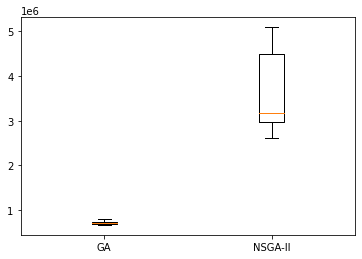

In [85]:
hv_ga = []
hv_nsgaii = []

for front in fronts_nsgaii:
    hv_nsgaii.append(hypervolume(front, (0,total_costs)))
        
for solution in solutions_ga:
    hv_ga.append(hypervolume(solution, (0,total_costs)))

results = {"GA"      : hv_ga, 
           "NSGA-II" : hv_nsgaii }

fig, ax = plt.subplots()
ax.boxplot(results.values())
ax.set_xticklabels(results.keys())

Since the GA only produces a single point, the hypervolume of NSGA-II is of course going to be much larger again.

### Normalisation

The concept of Pareto optimality itself is independent from scale and normalisation: it is strictly based on partial order only. For quality indicators, normalisation may be necessary so that multiple objectives contribute equally to the indicators. For example, we may want to make sure that profit and costs are weighted equally.

In [86]:
def hypervolume(front, r):
    front.sort(key=lambda i: i.fitness1)

    hv = (abs(r[0] - front[0].fitness1) / total_profit) * (abs(r[1] - front[0].fitness2) / total_costs)
    
    for i in range(1, len(front)):
        hv += (abs(front[i-1].fitness1 - front[i].fitness1) / total_profit) * (abs(r[1] - front[i].fitness2) / total_costs)
    
    return hv

Does it result in different hypervolumes?

[Text(1, 0, 'GA'), Text(2, 0, 'NSGA-II')]

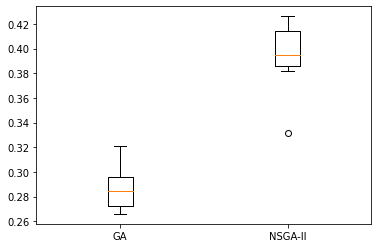

In [87]:
hv_ga = []
hv_nsgaii = []

for front in fronts_nsgaii:
    hv_nsgaii.append(hypervolume(front, (0,total_costs)))
        
for solution in solutions_ga:
    hv_ga.append(hypervolume(solution, (0,total_costs)))

results = {"GA"      : hv_ga, 
           "NSGA-II" : hv_nsgaii }

fig, ax = plt.subplots()
ax.boxplot(results.values())
ax.set_xticklabels(results.keys())

We will come across normalisation problems where we do not know the exact range. In this case it is possible to use normalisation functions like the following, which scales values in the range $[0,1]$:

In [88]:
def normalise(fitness):
    return abs(fitness)/(abs(fitness) + 1.0)

To see the effects of this function we can plot it for a range of values.

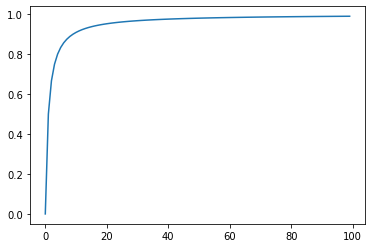

In [89]:
x = [x for x in range(0, 100)]
y = [normalise(x1) for x1 in x]
plt.plot(x,y)

Now that we know how to compare MOEAs, we will look at a couple of different algorithms.

## SPEA-2

The Strength Pareto Evolutionay Algorithm (SPEA) version 2 was defined in the following paper:

E. Zitzler, M. Laumanns and L. Thiele, "SPEA2: Improving the strength pareto evolutionary algorithm for multiobjective optimization", in Evolutionary Methods for Design, Optimisation and Control with Application to Industrial Problems, 2002.

This algorithm assigns a fitness to an individual based on the strength of its dominators. This fitness value is then minimised to produce solutions that are not dominated.

Another central distinguishing feature is the use of an archive.

The overall workflow of the algorithm is as follows:
1. Create initial population $P_0$ and create an empty archive $\bar{P}_0$.
2. Evaluate fitness values of the individuals in $P_t$ and $\bar{P}_t$
3. Copy all non-dominated individuals in in $P_t$ and $\bar{P}_t$ to $\bar{P}_{t+1}$. If $\bar{P}_{t+1}$ exceeds the maximum archive size then truncate; if it is smaller then fill up with dominated individuals from $P_t$ and $\bar{P}_t$.
4. Perform binary tournament selection with replacement on $\bar{P}_{t+1}$ to fill the mating pool
5. Apply recombination and mutation operators to the mating pool and set $P_{t+1}$ to the resulting population.
6. Repeat from step 2 until done

The solution is represented by the non-dominated individuals in $\bar{P}$ at the end.

Let's first look at how the fitness values are determined. The score of an individual is the number of solutions that it dominates:

$Score(i) = |j \; | \; j \in P_t \cup \bar{P}_t \wedge i 	\succ j   |$

Here, $i \succ j$ denotes that $i$ dominates $j$. (Note that Zitzler et al. use the operator $\succ$ the other way round as Deb et al.)

In [90]:
def score(individual, combined):
    score = 0
    for other in combined:
        if dominates(individual, other):
            score += 1

    individual.score = score

The raw fitness value of an individual is calculated as the sum of its dominators' strengths:

In [91]:
def raw_fitness(individual, combined):
    raw_fitness = 0
    for other in combined:
        if dominates(other, individual):
            raw_fitness += other.score

    individual.raw_fitness = raw_fitness

The fitness value considers not only the raw fitness, but also the density, such that individuals in less populated areas of the search space are preferred:

$Density(i) = \frac{1}{\sigma_i^k + 2}$

Here, $\sigma_i^k$ denotes the distance of $i$ to its $k$th neighbour, and $k = \sqrt{N + \bar{N}}$, where $N$ is the size of the population and $\bar{N}$ is the size of the archive.

The distance $\sigma$ is defined in terms of the objective values:

In [92]:
def get_distance(individual, other):
    sum = 0

    sum += (individual.fitness1 - other.fitness1) ** 2
    sum += (individual.fitness2 - other.fitness2) ** 2

    return sqrt(sum)

Now we just need to calculate these distances, sort, and assign to the individuals:

In [93]:
def density(individual, combined):
    k = int(sqrt(len(combined)))
    
    for i in range(len(combined)):
        individual = combined[i]
        distances = []
        for j in range(len(combined)):
            if i == j:
                continue
            other = combined[j]
            distances.append(1/(2.0 + get_distance(individual, other)))
        distances.sort()
        individual.distance = distances[k]        

To put it all together, the following function calculates the fitness (strength) of all individuals given a population and archive:

In [94]:
def calculate_strength(population, archive):
    combined = population + archive

    for individual in combined:
        score(individual, combined)
    for individual in combined:
        raw_fitness(individual, combined)
    for individual in combined:
        density(individual, combined)

    #map(lambda x: score(x, combined), combined)
    #map(lambda x: raw_fitness(x, combined), combined)
    #map(lambda x: density(x, combined), combined)
    
    for individual in combined:
        individual.fitness = individual.raw_fitness + individual.distance

The other unique aspect of this algorithm is the handling of the archive. The size of the archive is constant over time, which means that sometimes individuals need to be removed or added in order to adjust the size. 

The _truncate_ function removes individuals from the archive; at each step, the individual which has the minimum distance to another individual is chosen for removal until the archive is not longer too large. When multiple individuals have the same distance to their closest neighbour, they are compared against by next closest neighbour until a difference is found. For this, we need a custom comparison operator:

In [95]:
def compare_distances(distances1, distances2):
    for i in range(len(distances1)):
        if distances1[i] != distances2[i]:
            return distances1[i] - distances2[i]
    return 0

The truncate function now needs to determine all distances and then sort the individuals in order to decide which ones to drop:

In [96]:
from functools import cmp_to_key
def truncate(archive):
    # Remove individual with minimum distance
    num_remove = abs(population_size - len(archive))
    print(f"Have to remove {num_remove}")

    for i in range(len(archive)):
        individual = archive[i]
        distances = []
        for j in range(len(archive)):
            if i == j:
                continue
            other = archive[j]
            distances.append(get_distance(individual, other))
            distances.sort()
        individual.distances = distances
        
        # This ignores the case that multiple individuals have the same distance
        # in which case we need to look at the next distance

    def compare(x, y):
        return compare_distances(x.distances, y.distances)
    archive.sort(key=cmp_to_key(compare))
    for i in range(num_remove):
        del archive[0]

Since Python >= 3 only supports the use of keys to sort lists, this function uses some extra code to wrap out `compare_distances` function as a key function.

If the archive is too small, then we fill it with the best dominated individuals from the population. Thus, we sort the population by fitness (i.e., strength), and then pick from the sorted list.

In [97]:
def pad_archive(next_archive, population, archive):
    num_missing = population_size - len(next_archive)
    print(f"Adding {num_missing} dominated individuals to population")
    # fill with dominated individuals in archive and population
    candidates = [i for i in population+archive if i.fitness >= 1]
    candidates.sort(key = lambda r : r.fitness)
    next_archive.extend(candidates[:num_missing])
    print(f"New size: {len(next_archive)}")


The mating is the same we already know from other evolutionary algorithms. The selection operator used is a binary tournament similar to what NSGA-II uses. However, unlike the binary tournament in NSGA-II, the tournament isnow decided by the strength (fitness) function:

In [98]:
def binary_tournament_fitness(population):
    individual1 = random.choice(population)
    individual2 = random.choice(population)

    if individual1.fitness < individual2.fitness:
        return individual1
    elif individual1.fitness > individual2.fitness:
        return individual2
    else:
        return random.choice([individual1, individual2])

Selected individuals are subjected to crossover and mutation as usual:

In [99]:
def generate_offspring_spea2(population):
    offspring_population = []
    while len(offspring_population) < population_size:
        parent1, parent2 = binary_tournament_fitness(population), binary_tournament_fitness(population)
        if random.random() < P_xover:
            offspring1, offspring2 = crossover(parent1, parent2)
        else:
            offspring1, offspring2 = parent1, parent2
        offspring1 = mutate(offspring1)
        offspring2 = mutate(offspring2)

        offspring_population.append(offspring1)
        offspring_population.append(offspring2)

    return offspring_population

Now we have all the components in place and can implement the overall algorithm:

In [100]:
def spea2():
    initialise_plot()
    population = [get_random_individual() for _ in range(0,population_size)]
    archive = []

    for iteration in range(max_gen):
        print("Iteration {}:".format(iteration))
        plot(population+archive)

        print("Calculating strength")
        calculate_strength(population, archive)

        # Copy all non-dominated individuals in population and archive to next archive
        next_archive = []
        for i in population + archive:
            if i.fitness < 1:
                next_archive.append(i)
        print("Copied {} non-dominated individuals".format(len(next_archive)))

        if len(next_archive) < population_size:
            pad_archive(next_archive, population, archive)

        if len(next_archive) > population_size:
            truncate(next_archive)
            print("Truncated population to {}".format(len(next_archive)))


        # Mating selection:
        next_generation = generate_offspring_spea2(next_archive)
        print("Mating pool size: {}".format(len(next_generation)))

        population = next_generation
        archive = next_archive

        # Termination: return non-dominated individuals in next_archive
        result = [p for p in next_archive if p.fitness < 1]

    plot(result)

    #for p in result:
    #    print("Result: {}, Profit: {}, Cost: {}".format([x for x in range(len(p)) if p[x] == 1], function1(p), function2(p)))
    return result

In [101]:
result = spea2()
diversity_spea2 = diversity_values

Iteration 0:
Calculating strength
Copied 7 non-dominated individuals
Adding 13 dominated individuals to population
New size: 20
Mating pool size: 20
Iteration 1:
Calculating strength
Copied 10 non-dominated individuals
Adding 10 dominated individuals to population
New size: 20
Mating pool size: 20
Iteration 2:
Calculating strength
Copied 10 non-dominated individuals
Adding 10 dominated individuals to population
New size: 20
Mating pool size: 20
Iteration 3:
Calculating strength
Copied 9 non-dominated individuals
Adding 11 dominated individuals to population
New size: 20
Mating pool size: 20
Iteration 4:
Calculating strength
Copied 14 non-dominated individuals
Adding 6 dominated individuals to population
New size: 20
Mating pool size: 20
Iteration 5:
Calculating strength
Copied 17 non-dominated individuals
Adding 3 dominated individuals to population
New size: 20
Mating pool size: 20
Iteration 6:
Calculating strength
Copied 17 non-dominated individuals
Adding 3 dominated individuals to 

Copied 25 non-dominated individuals
Have to remove 5
Truncated population to 20
Mating pool size: 20
Iteration 61:
Calculating strength
Copied 24 non-dominated individuals
Have to remove 4
Truncated population to 20
Mating pool size: 20
Iteration 62:
Calculating strength
Copied 28 non-dominated individuals
Have to remove 8
Truncated population to 20
Mating pool size: 20
Iteration 63:
Calculating strength
Copied 28 non-dominated individuals
Have to remove 8
Truncated population to 20
Mating pool size: 20
Iteration 64:
Calculating strength
Copied 24 non-dominated individuals
Have to remove 4
Truncated population to 20
Mating pool size: 20
Iteration 65:
Calculating strength
Copied 24 non-dominated individuals
Have to remove 4
Truncated population to 20
Mating pool size: 20
Iteration 66:
Calculating strength
Copied 29 non-dominated individuals
Have to remove 9
Truncated population to 20
Mating pool size: 20
Iteration 67:
Calculating strength
Copied 24 non-dominated individuals
Have to remo

In [102]:
im_ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=3000, blit=True)
HTML(im_ani.to_jshtml())

## Two Archives

The Two Archives algorithm generalises the idea of using archives and uses one for convergence, and another one for diversity:

- If a new solution is not dominated by both archives and dominates at least one solution in either archive, it goes into the convergence archive. 
- If a new solution is not dominated by both archives but fails to dominate any solution in either archive, it goes into the diversity archive. 
- When the archives get full, the convergence archive is preserved while the diversity archive is pruned based on crowding distance. 

Praditwong, K., & Yao, X. (2006, November). A new multi-objective evolutionary optimisation algorithm: The two-archive algorithm. In 2006 International Conference on Computational Intelligence and Security (Vol. 1, pp. 286-291). IEEE.

The general workflow is as follows:
1. Initialise the population (as usual)
2. Initialise both archives as empty sets
3. Evaluate the initial population
4. Repeat until done:
5. Collect non-dominated individuals to the archives
6. Generate new population with parents from archives
7. Evaluate new population

During selection, one of the archives is probabilistically chosen. The probability is a pre-defined parameter that is a ratio to choose members from the convergence archive to the diversity archive. A member in the chosen archive is selected uniformly at random.

In [103]:
def twoarchive_selection(convergence_archive, diversity_archive):
    if not convergence_archive:
        return random.choice(diversity_archive)
    if not diversity_archive:
        return random.choice(convergence_archive)
    if random.random() < 0.5:
        return random.choice(convergence_archive)
    else:
        return random.choice(diversity_archive)

The selection is the only difference in terms of reproduction compared to other evolutionary algorithms we have seen previously:

In [104]:
def twoarchive_generate_offspring(convergence_archive, diversity_archive):
    offspring_population = []
    while len(offspring_population) < population_size:
        parent1 = twoarchive_selection(convergence_archive, diversity_archive)
        parent2 = twoarchive_selection(convergence_archive, diversity_archive)
        if random.random() < P_xover:
            offspring1, offspring2 = crossover(parent1, parent2)
        else:
            offspring1, offspring2 = parent1, parent2
        offspring1 = mutate(offspring1)
        offspring2 = mutate(offspring2)

        offspring_population.append(offspring1)
        offspring_population.append(offspring2)

    return offspring_population

We need to select all individuals from the resulting population that are not dominated by the archives. For this, we need some helper functions. First, we define a helper function that tells us whether a candidate solution is dominated by an archive:

In [105]:
def is_dominated(individual, archive):
    for i in archive:
        if dominates(i, individual):
            return True
    return False

Second,we need to select all dominated individuals from an archive, as we want to remove all of them when adding a new non-dominated solution:

In [106]:
def get_dominated(individual, archive):
    dominated = []
    for i in archive:
        if dominates(individual, i):
            dominated.append(i)
    return dominated

A new individual is first compared with all members in the current archives. If it is dominated by a member of the archives, it is discarded, otherwise it becomes a new member of the archives.

The remainder of the archives are compared with the new member and two cases are possible:
- If the new member dominates a member of the archives then the dominated member is removed and the new member is received by the _convergence_ archive 
- If the new member does not dominate any members and is not dominated by any archive members then it becomes a member of the diversity archive, and the size of the diversity archive is increased. 

In [107]:
def collect_nondominated(individual, ca, da):
    # TODO: During this stage, any duplicated member is deleted.

    if is_dominated(individual, ca) or is_dominated(individual, da):
        return

    dominated_ca = get_dominated(individual, ca)
    dominated_da = get_dominated(individual, da)
    if len(dominated_ca) + len(dominated_da) > 0:
        for i in dominated_ca:
            ca.remove(i)
        for i in dominated_da:
            da.remove(i)
        ca.append(individual)
    else:
        # No individuals are dominated
        da.append(individual)

If the total size of the archives overflows, then we need to remove individuals. The removal operator deletes only members in the diversity archive and has no impact on the convergence archive. 

To select which members to remove from the diversity archive, we calculate the shortest distance to the nearest member in the convergence archive for all members in the diversity archive. The member with the shortest distance among the diversity members is deleted until the total size equals the capacity. 

In [108]:
archive_size = 40

def remove(ca, da):
    if len(ca) + len(da) > archive_size:
        for individual in da:
            individual.length = 4444444444444444 # very large...
            for other in ca:
                d = get_distance(individual, other)
                if individual.length > d:
                    individual.length = d
        da.sort(key=lambda r: r.length)
        while len(ca) + len(da) > archive_size:
            del da[0]

At the end, the solution returned consists of all non-dominated individuals in the convergence archive, so we'll define another helper function that extracts all these individuals from an archive or population:

In [109]:
def get_nondominated(population):
    nondominated = []

    for i in range(len(population)):
        dominated = False
        for j in range(len(population)):
            if i == j:
                continue
            if dominates(population[j], population[i]):
                dominated = True
                break
        if not dominated:
            nondominated.append(population[i])

    return nondominated

Now we just need to put everything together. 

In [110]:
def twoarchives():
    initialise_plot()
    population = [get_random_individual() for _ in range(population_size)]
    convergence_archive = []
    diversity_archive   = []

    for iteration in range(max_gen):
        print("Iteration {}".format(iteration))
        plot(population+convergence_archive+diversity_archive)

        # Collect non-dominated individuals
        for i in get_nondominated(population):
            collect_nondominated(i, convergence_archive, diversity_archive)

        # Truncate archive sizes
        remove(convergence_archive, diversity_archive)
        print("Archive sizes: {} and {}".format(len(convergence_archive), len(diversity_archive)))

        next_generation = twoarchive_generate_offspring(convergence_archive, diversity_archive)
        population = next_generation

    result = get_nondominated(convergence_archive)
    plot(result)
    return result

In [111]:
result = twoarchives()
diversity_ta = diversity_values

Iteration 0
Archive sizes: 0 and 4
Iteration 1
Archive sizes: 2 and 9
Iteration 2
Archive sizes: 3 and 8
Iteration 3
Archive sizes: 3 and 7
Iteration 4
Archive sizes: 4 and 12
Iteration 5
Archive sizes: 8 and 4
Iteration 6
Archive sizes: 8 and 9
Iteration 7
Archive sizes: 10 and 12
Iteration 8
Archive sizes: 11 and 16
Iteration 9
Archive sizes: 12 and 18
Iteration 10
Archive sizes: 12 and 23
Iteration 11
Archive sizes: 12 and 20
Iteration 12
Archive sizes: 10 and 8
Iteration 13
Archive sizes: 9 and 4
Iteration 14
Archive sizes: 9 and 5
Iteration 15
Archive sizes: 10 and 2
Iteration 16
Archive sizes: 11 and 8
Iteration 17
Archive sizes: 10 and 3
Iteration 18
Archive sizes: 12 and 3
Iteration 19
Archive sizes: 12 and 5
Iteration 20
Archive sizes: 11 and 8
Iteration 21
Archive sizes: 10 and 10
Iteration 22
Archive sizes: 10 and 6
Iteration 23
Archive sizes: 8 and 1
Iteration 24
Archive sizes: 8 and 2
Iteration 25
Archive sizes: 7 and 8
Iteration 26
Archive sizes: 8 and 13
Iteration 27
Arc

In [112]:
im_ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=3000, blit=True)
HTML(im_ani.to_jshtml())

## SMS-MOEA

We've been comparing the multi-objective algorithms in terms of the hypervolume, although they used domination and diversity measurements to guide the search. An alternative is to use the hypervolume _directly_ to drive the search. The hypervolume is often referred to as S metric, and the ideato optimise the hypervolume is implemented in the S metric selection evolutionary multi objective algorithm (SMS-MOEA):

Beume, N., Naujoks, B., & Emmerich, M. (2007). SMS-EMOA: Multiobjective selection based on dominated hypervolume. European Journal of Operational Research, 181(3), 1653-1669.

The overall principle of SMS-EMOA is the following:
1. Generate a random population of individuals
2. Repeat until done:
3. Generate an offspring by variation
4. Replace existing member of population if it improves the hypervolume

The _reduce_ function sorts the population using fast non-dominated sort (as introduced with NSGA-II), and then discards one individual from the worst fromt. The choice of which individual to discard is determined by the contribution the hypervolume: The individual contributing least to the hypervolume is the one discarded.

In [113]:
def reduce(population):
    fronts = fast_non_dominated_sort(population)
    last_front = [population[index] for index in fronts[-1]]
    if len(last_front) > 1:
        hypervolumes = []
        for i in range(len(last_front)):
            front = last_front[:i] + last_front[i+1:]
            hypervolumes.append(hypervolume(front, (0,total_costs)))
        chosen = last_front[hypervolumes.index(max(hypervolumes))]
        population.remove(chosen)
    else:
        population.remove(last_front[0])

Since the calculation of the hypervolume can be computationally expensive,the algorithm is implemented as a steady state algorithm.

In [114]:
def sms():
    initialise_plot()
    population = [get_random_individual() for _ in range(population_size)]
    initial = get_nondominated(population)
    iteration = 0

    for step in range(max_gen * population_size):
        if step % population_size == 0:
            iteration += 1
            print("Iteration {}".format(iteration))
            diversity_values.append(pairwise_distance(population))
            plot(population)

        parent1, parent2 = random.choice(population), random.choice(population)
        if random.random() < P_xover:
            offspring1, offspring2 = crossover(parent1, parent2)
        else:
            offspring1, offspring2 = parent1, parent2
        
        population.append(mutate(random.choice([offspring1, offspring2])))
        reduce(population)

    result = get_nondominated(population)
    plot(result)
    return result 

In [115]:
def hypervolume(front, r):
    front.sort(key=lambda i: i.fitness1)

    hv = (abs(r[0] - front[0].fitness1) / total_profit) * (abs(r[1] - front[0].fitness2) / total_costs)
    
    for i in range(1, len(front)):
        hv += (abs(front[i-1].fitness1 - front[i].fitness1) / total_profit) * (abs(r[1] - front[i].fitness2) / total_costs)
    
    return hv

In [116]:
result = sms()
diversity_sms = diversity_values

Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10
Iteration 11
Iteration 12
Iteration 13
Iteration 14
Iteration 15
Iteration 16
Iteration 17
Iteration 18
Iteration 19
Iteration 20
Iteration 21
Iteration 22
Iteration 23
Iteration 24
Iteration 25
Iteration 26
Iteration 27
Iteration 28
Iteration 29
Iteration 30
Iteration 31
Iteration 32
Iteration 33
Iteration 34
Iteration 35
Iteration 36
Iteration 37
Iteration 38
Iteration 39
Iteration 40
Iteration 41
Iteration 42
Iteration 43
Iteration 44
Iteration 45
Iteration 46
Iteration 47
Iteration 48
Iteration 49
Iteration 50
Iteration 51
Iteration 52
Iteration 53
Iteration 54
Iteration 55
Iteration 56
Iteration 57
Iteration 58
Iteration 59
Iteration 60
Iteration 61
Iteration 62
Iteration 63
Iteration 64
Iteration 65
Iteration 66
Iteration 67
Iteration 68
Iteration 69
Iteration 70
Iteration 71
Iteration 72
Iteration 73
Iteration 74
Iteration 75
Iteration 76
Iteration 77
Iteratio

In [117]:
im_ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=3000, blit=True)
HTML(im_ani.to_jshtml())

## PAES

As final example of a multi-objective search algorithm, we consider the Pareto Archived Evolution Strategy (PAES):

J. Knowles, D. Corne. “The pareto archived evolution strategy: A new baseline algorithm for pareto multiobjective optimisation.” In Congress on Evolutionary Computation (CEC99) (Vol. 1, pp. 98-105). 1999

PAES is intended to be the simplest possible non-trivial algorithm capable of generating diverse solutions in the Pareto optimal set. It essentiall is a (1+1)ES adapted for multi-objective search, and is intended as baseline approach for evaluation of other algorithms.

Like a (1+1)ES the algorithm has a population of size 1 and produces 1 offspring. In addition, there is an archive which stores non-dominated solutions (subject to diversity criteria). At the end of the run, the archive is the final result.

The archive is also used in order to decide whether or not to accept an offspring:
- Candidates which dominate the archive are always accepted and archived.
- Candidates which are dominated by the archive are always rejected.
- Non-dominated are accepted/archived based on how many similar individuals already exist

We start by defining some helper functions again. First, we need an update operation that removes all dominated individuals from an archive:

In [118]:
def remove_dominated(individual, archive):
    copy = []
    for i in archive:
        if not dominates(individual, i):
            copy.append(i)

    archive.clear()
    archive.extend(copy)

Second, we need an operation that updates the archive. As we are using lists but technically the archive should be an set for PAES, we'll have to add a check here (inefficient, but shorter than redefining previous operations to work on sets rather than lists):

In [119]:
def add_to_archive(individual, archive):
    if not individual in archive:
        archive.append(individual)

When there is dominance, the choice of what to do is easy. The more tricky case is when the new individual is not dominated by the archive. As the archive has a maximum size, we need to decide which individuals to keep once we hit the maximum. In PAES, this is done using a grid from which we can infer which areas of the objective space are more crowded. 

In [120]:
grid_size = 10

def get_grid(archive):
    grid = {}
    max_profit = max([i.fitness1 for i in archive])+1
    max_effort = max([i.fitness2 for i in archive])+1
    f1step = max_profit / grid_size
    f2step = max_effort / grid_size

    for x in range(grid_size):
        grid[x] = {}
        for y in range(grid_size):
            grid[x][y] = []

    for individual in archive:
        x = individual.fitness1 // f1step
        y = individual.fitness2 // f2step
        grid[x][y].append(individual)

    return grid

We want to add individuals to the grid if they help us preserve diversity. Thus, we check if we would add the individual to the most crowded grid cell:

In [121]:
def increases_diversity(individual, grid):
    max_crowd = 0
    target_crowd = 0

    for x in range(grid_size):
        for y in range(grid_size):
            num = len(grid[x][y])
            if num > max_crowd:
                max_crowd = num
            if individual in grid[x][y]:
                target_crowd = num

    return target_crowd < max_crowd

We can also compare individuals in terms of how crowded their grid cells are:

In [122]:
def less_crowded_than(individual1, individual2, grid):
    individual1_crowd = 0
    individual2_crowd = 0

    for x in range(grid_size):
        for y in range(grid_size):
            if individual1 in grid[x][y]:
                individual1_crowd = len(grid[x][y])
            if individual2 in grid[x][y]:
                individual2_crowd = len(grid[x][y])

    return individual1_crowd < individual2_crowd

Finally, if we need to reduce the size of the archive, we randomly pick one individual from the most crowded grid cell:

In [123]:
def remove_from_grid(grid, archive):
    pos_x, pos_y = 0, 0
    max_crowd = 0

    for x in range(grid_size):
        for y in range(grid_size):
            num = len(grid[x][y])
            if num > max_crowd:
                max_crowd = num
                pos_x, pos_y = x, y

    selected = random.choice(grid[pos_x][pos_y])
    archive.remove(selected)

The PAES algorithm itself mainly consists of the logic to decide what to do in case of non-domination:

In [124]:
def paes():
    initialise_plot()
    archive = []
    current = get_random_individual()
    add_to_archive(current, archive)

    iteration = 0
    for step in range(population_size * max_gen):
        candidate = mutate(current)
        while candidate == current or candidate in archive:
            candidate = mutate(current)
        if step % population_size == 0:
            print("Iteration {}: Candidate: Profit {}, Cost {}".format(iteration, candidate.fitness1, candidate.fitness2))
            plot(archive + [candidate])
            iteration += 1

        if not dominates(current, candidate) and not is_dominated(candidate, archive):
            dominated_archive = get_dominated(candidate, archive)
            if dominated_archive:
                # If the candidate dominates something in the archive
                # we keep it in the archive and make it the new current
                remove_dominated(candidate, archive)
                add_to_archive(candidate, archive)
                current = candidate
            else:
                grid = get_grid(archive)
                
                if len(archive) == population_size:
                    # Maximum archive size reached
                    if increases_diversity(candidate, grid):
                        remove_from_grid(grid, archive)
                        add_to_archive(candidate, archive)
                        if less_crowded_than(candidate, current, grid):
                            current = candidate
                else:
                    # Enough space in archive
                    add_to_archive(candidate, archive)
                    if less_crowded_than(candidate, current, grid):
                        current = candidate

    return get_nondominated(archive)

In [125]:
result = paes()
diversity_paes = diversity_values

Iteration 0: Candidate: Profit 634, Cost 480
Iteration 1: Candidate: Profit 815, Cost 446
Iteration 2: Candidate: Profit 807, Cost 435
Iteration 3: Candidate: Profit 871, Cost 435
Iteration 4: Candidate: Profit 812, Cost 408
Iteration 5: Candidate: Profit 892, Cost 377
Iteration 6: Candidate: Profit 795, Cost 362
Iteration 7: Candidate: Profit 552, Cost 287
Iteration 8: Candidate: Profit 509, Cost 229
Iteration 9: Candidate: Profit 427, Cost 215
Iteration 10: Candidate: Profit 414, Cost 199
Iteration 11: Candidate: Profit 383, Cost 193
Iteration 12: Candidate: Profit 421, Cost 202
Iteration 13: Candidate: Profit 478, Cost 189
Iteration 14: Candidate: Profit 601, Cost 241
Iteration 15: Candidate: Profit 776, Cost 278
Iteration 16: Candidate: Profit 807, Cost 309
Iteration 17: Candidate: Profit 874, Cost 325
Iteration 18: Candidate: Profit 943, Cost 316
Iteration 19: Candidate: Profit 933, Cost 297
Iteration 20: Candidate: Profit 889, Cost 311
Iteration 21: Candidate: Profit 1188, Cost 3

In [126]:
im_ani = animation.ArtistAnimation(fig, ims, interval=50, repeat_delay=3000, blit=True)
HTML(im_ani.to_jshtml())

## Comparison

We have already collected fronts for the GA and NSGA-II, so we need to do the same for the other MOEAs:

In [127]:
fronts_spea2 = run_times(spea2, 10)
fronts_ta = run_times(twoarchives, 10)
fronts_sms = run_times(sms, 10)
fronts_paes = run_times(paes, 10)

As a sanity check for our comparison, we can also include random search again. We only need to modify it slightly so that it returns all non-dominated individuals:

In [128]:
def random_moo():
    candidates = [get_random_individual() for _ in range(max_gen * population_size)]
    return get_nondominated(candidates)

In [129]:
fronts_random = run_times(random_moo, 10)

To compare using generational distance, we need to update our reference front:

In [130]:
merged_fronts = [] 
for front in solutions_ga:
    merged_fronts.extend(front)    
for front in fronts_nsgaii:
    merged_fronts.extend(front)
for front in fronts_spea2:
    merged_fronts.extend(front)
for front in fronts_ta:
    merged_fronts.extend(front)
for front in fronts_sms:
    merged_fronts.extend(front)
for front in fronts_paes:
    merged_fronts.extend(front)
for front in fronts_random:
    merged_fronts.extend(front)
    
sorted_results = fast_non_dominated_sort(merged_fronts)[0]
reference_front = [merged_fronts[x] for x in sorted_results]

Now we can do the comparison in terms of the `igd` function.

[Text(1, 0, 'GA'),
 Text(2, 0, 'NSGA-II'),
 Text(3, 0, 'SPEA2'),
 Text(4, 0, 'Two Archives'),
 Text(5, 0, 'SMS'),
 Text(6, 0, 'PAES'),
 Text(7, 0, 'Random')]

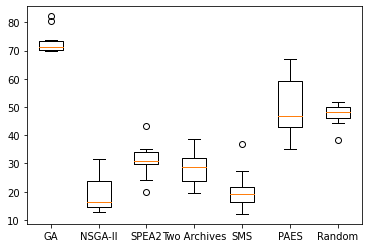

In [131]:
igd_ga     = [igd(front, reference_front) for front in solutions_ga]
igd_nsgaii = [igd(front, reference_front) for front in fronts_nsgaii]
igd_spea2  = [igd(front, reference_front) for front in fronts_spea2]
igd_ta     = [igd(front, reference_front) for front in fronts_ta]
igd_sms    = [igd(front, reference_front) for front in fronts_sms]
igd_paes   = [igd(front, reference_front) for front in fronts_paes]
igd_random = [igd(front, reference_front) for front in fronts_random]

results = {"GA"      : igd_ga, 
           "NSGA-II" : igd_nsgaii,
           "SPEA2"   : igd_spea2,
           "Two Archives" : igd_ta,
           "SMS"     : igd_sms,
           "PAES"    : igd_paes,
           "Random"  : igd_random }

fig, ax = plt.subplots()
ax.boxplot(results.values())
ax.set_xticklabels(results.keys())

Similarly, we can perform the comparison using the hypervolume and our reference point.

[Text(1, 0, 'GA'),
 Text(2, 0, 'NSGA-II'),
 Text(3, 0, 'SPEA2'),
 Text(4, 0, 'Two Archives'),
 Text(5, 0, 'SMS'),
 Text(6, 0, 'PAES'),
 Text(7, 0, 'Random')]

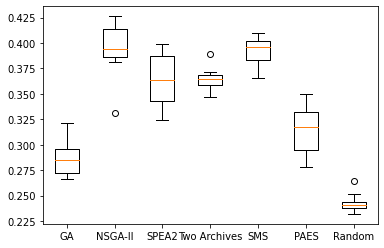

In [132]:
hv_ga     = [hypervolume(front, (0,total_costs)) for front in solutions_ga]
hv_nsgaii = [hypervolume(front, (0,total_costs)) for front in fronts_nsgaii]
hv_spea2  = [hypervolume(front, (0,total_costs)) for front in fronts_spea2]
hv_ta     = [hypervolume(front, (0,total_costs)) for front in fronts_ta]
hv_sms    = [hypervolume(front, (0,total_costs)) for front in fronts_sms]
hv_paes   = [hypervolume(front, (0,total_costs)) for front in fronts_paes]
hv_random = [hypervolume(front, (0,total_costs)) for front in fronts_random]

results = {"GA"      : hv_ga, 
           "NSGA-II" : hv_nsgaii,
           "SPEA2"   : hv_spea2,
           "Two Archives" : hv_ta,
           "SMS"     : hv_sms,
           "PAES"    : hv_paes,
           "Random"  : hv_random}

fig, ax = plt.subplots()
ax.boxplot(results.values())
ax.set_xticklabels(results.keys())

As always the performance of an algorithm may differ between problems; furthermore, there are many different parameters that influence the performance, so it is difficult to draw general conclusions. We will investigate the question of parameters in a later chapter. 

Although we covered several different MOEAs in this chapter, there are many more. Furthermore, as we will see, not only evolutionary algorithms are suitable for solving multi objective problems, but also many other types of algorithms.